## 서울시 시군구 지도 시각화 테스트

In [1]:
import geopandas as gpd

# Load the Shapefile
shapefile_path = "/Users/songsooyeoun/Desktop/git_test/streamlit/project1/sig_20230729/sig.shp"

seoul_gpd  = gpd.read_file(shapefile_path, encoding='cp949')
seoul_gpd = seoul_gpd[seoul_gpd['SIG_CD'].astype(str).str.startswith('11')]
seoul_gpd

,SIG_CD,SIG_ENG_NM,SIG_KOR_NM,geometry
0,11110,Jongno-gu,종로구,"POLYGON ((956615.453 1953567.199, 956621.579 1..."
1,11140,Jung-gu,중구,"POLYGON ((957890.386 1952616.746, 957909.908 1..."
2,11170,Yongsan-gu,용산구,"POLYGON ((953115.761 1950834.084, 953114.206 1..."
3,11200,Seongdong-gu,성동구,"POLYGON ((959681.109 1952649.605, 959842.412 1..."
4,11215,Gwangjin-gu,광진구,"POLYGON ((964825.058 1952633.25, 964875.565 19..."
5,11230,Dongdaemun-gu,동대문구,"POLYGON ((962141.919 1956519.461, 962149.853 1..."
6,11260,Jungnang-gu,중랑구,"POLYGON ((965698.531 1957987.355, 965772.29 19..."
7,11290,Seongbuk-gu,성북구,"POLYGON ((956787.318 1953542.506, 956761.258 1..."
8,11305,Gangbuk-gu,강북구,"POLYGON ((956316.789 1965175.345, 956401.551 1..."
9,11320,Dobong-gu,도봉구,"POLYGON ((957223.835 1961199.545, 957195.758 1..."


In [2]:
seoul_gpd = seoul_gpd.set_crs(epsg='5178', allow_override=True)
seoul_gpd.to_crs(epsg='4326').head()

,SIG_CD,SIG_ENG_NM,SIG_KOR_NM,geometry
0,11110,Jongno-gu,종로구,"POLYGON ((127.00648 37.58322, 127.00655 37.583..."
1,11140,Jung-gu,중구,"POLYGON ((127.02098 37.57471, 127.0212 37.5746..."
2,11170,Yongsan-gu,용산구,"POLYGON ((126.96702 37.55841, 126.96701 37.557..."
3,11200,Seongdong-gu,성동구,"POLYGON ((127.04125 37.57509, 127.04308 37.574..."
4,11215,Gwangjin-gu,광진구,"POLYGON ((127.09951 37.57515, 127.10008 37.574..."


In [3]:
seoul_gpd['center_point'] = seoul_gpd['geometry'].geometry.centroid
seoul_gpd['geometry'] = seoul_gpd['geometry'].to_crs(epsg=4326)
seoul_gpd['center_point'] = seoul_gpd['center_point'].to_crs(epsg=4326)
seoul_gpd['경도'] = seoul_gpd['center_point'].map(lambda x: x.xy[0][0])
seoul_gpd['위도'] = seoul_gpd['center_point'].map(lambda x: x.xy[1][0])
seoul_gpd.head()

,SIG_CD,SIG_ENG_NM,SIG_KOR_NM,geometry,center_point,경도,위도
0,11110,Jongno-gu,종로구,"POLYGON ((127.00648 37.58322, 127.00655 37.583...",POINT (126.97516 37.59767),126.975159,37.597667
1,11140,Jung-gu,중구,"POLYGON ((127.02098 37.57471, 127.0212 37.5746...",POINT (126.99381 37.56289),126.993806,37.562893
2,11170,Yongsan-gu,용산구,"POLYGON ((126.96702 37.55841, 126.96701 37.557...",POINT (126.97775 37.53413),126.977745,37.534135
3,11200,Seongdong-gu,성동구,"POLYGON ((127.04125 37.57509, 127.04308 37.574...",POINT (127.0389 37.55378),127.038898,37.553780
4,11215,Gwangjin-gu,광진구,"POLYGON ((127.09951 37.57515, 127.10008 37.574...",POINT (127.08359 37.54947),127.083585,37.549471


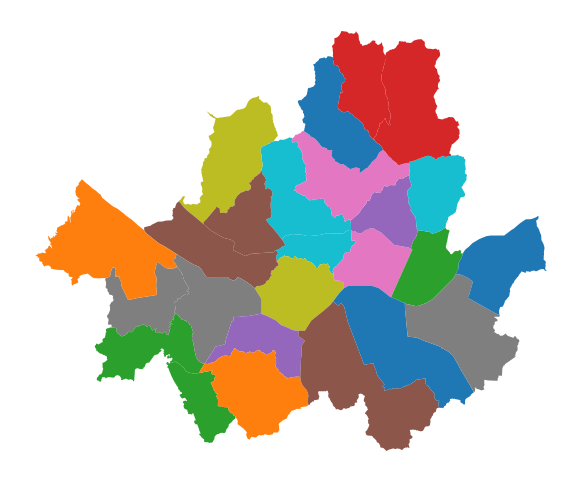

In [4]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10,6))
seoul_gpd.plot(column='SIG_KOR_NM', ax=ax)
plt.axis('off')
plt.show()

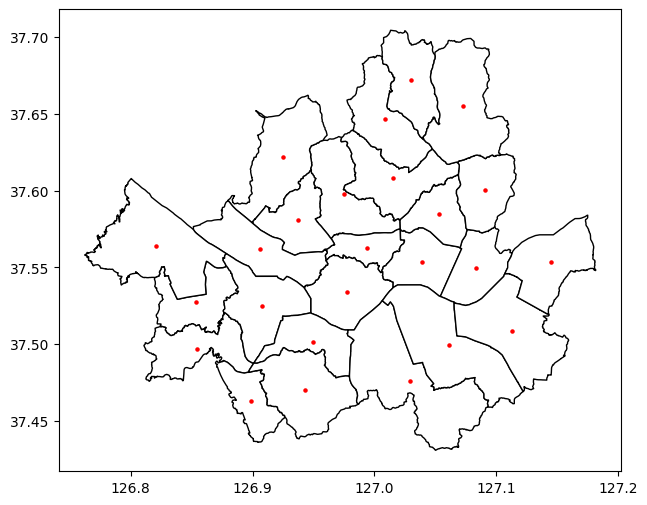

In [5]:
fig, ax = plt.subplots(figsize=(10,6))
seoul_gpd.plot(ax=ax, color='white', edgecolor='black')
seoul_gpd['center_point'].plot(marker='o', color='red', markersize=5, ax=ax)
plt.show()

## 서울시 부동산 데이터와 병합

In [6]:
import pandas as pd
seoul = pd.read_csv('/Users/songsooyeoun/Desktop/git_test/streamlit/project1/data/seoul_real_estate.csv', parse_dates=['CTRT_DAY'])
seoul['month'] = seoul['CTRT_DAY'].dt.month
seoul = seoul[(seoul['BLDG_USG']=='아파트') & (seoul['month'].isin([2,3]))]
seoul = seoul[['CTRT_DAY', 'month', 'CGG_CD', 'CGG_NM', 'THING_AMT', 'BLDG_USG']].reset_index(drop=True)
seoul.head()

,CTRT_DAY,month,CGG_CD,CGG_NM,THING_AMT,BLDG_USG
0,2025-03-22,3,11230,동대문구,142000,아파트
1,2025-03-22,3,11230,동대문구,117000,아파트
2,2025-03-21,3,11590,동작구,140000,아파트
3,2025-03-21,3,11410,서대문구,86000,아파트
4,2025-03-21,3,11680,강남구,230000,아파트


In [7]:
summary_df = seoul.groupby(['CGG_CD', 'month'])['THING_AMT'].agg(['mean', 'std', 'size']).reset_index()
summary_df.head(4)

,CGG_CD,month,mean,std,size
0,11110,2,159338.484848,73197.562294,33
1,11110,3,128944.444444,74052.455353,18
2,11140,2,115686.111111,43120.036949,54
3,11140,3,101776.315789,31439.718675,38


In [8]:
summary_df = summary_df.rename(columns={'CGG_CD':'SIG_CD'})
summary_df['SIG_CD'] = summary_df['SIG_CD'].astype(str)

In [9]:
merge_df = seoul_gpd.merge(summary_df, on='SIG_CD')
merge_df.head()

,SIG_CD,SIG_ENG_NM,SIG_KOR_NM,geometry,center_point,경도,위도,month,mean,std,size
0,11110,Jongno-gu,종로구,"POLYGON ((127.00648 37.58322, 127.00655 37.583...",POINT (126.97516 37.59767),126.975159,37.597667,2,159338.484848,73197.562294,33
1,11110,Jongno-gu,종로구,"POLYGON ((127.00648 37.58322, 127.00655 37.583...",POINT (126.97516 37.59767),126.975159,37.597667,3,128944.444444,74052.455353,18
2,11140,Jung-gu,중구,"POLYGON ((127.02098 37.57471, 127.0212 37.5746...",POINT (126.99381 37.56289),126.993806,37.562893,2,115686.111111,43120.036949,54
3,11140,Jung-gu,중구,"POLYGON ((127.02098 37.57471, 127.0212 37.5746...",POINT (126.99381 37.56289),126.993806,37.562893,3,101776.315789,31439.718675,38
4,11170,Yongsan-gu,용산구,"POLYGON ((126.96702 37.55841, 126.96701 37.557...",POINT (126.97775 37.53413),126.977745,37.534135,2,220569.291667,108737.715661,96


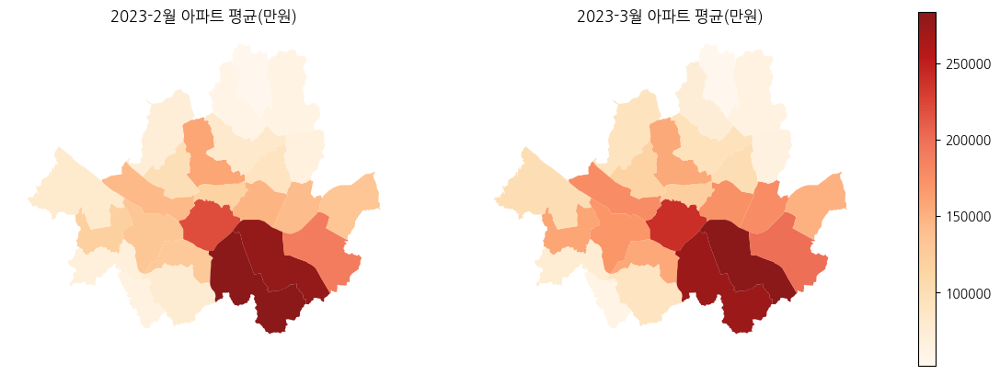

In [10]:
from matplotlib import font_manager, rc

plt.rcParams['font.family'] = "NanumGothic"

fig, ax = plt.subplots(ncols=2, sharey=True, figsize=(15,10))
merge_df[merge_df['month']==2].plot(ax=ax[0], column='mean', cmap='OrRd', legend=False, alpha=0.9)
merge_df[merge_df['month']==3].plot(ax=ax[1], column='mean', cmap='OrRd', legend=False, alpha=0.9)
patch_col = ax[0].collections[0]
cb = fig.colorbar(patch_col, ax=ax, shrink=0.5)
ax[0].set_title("2023-2월 아파트 평균(만원)")
ax[1].set_title("2023-3월 아파트 평균(만원)")
ax[0].set_axis_off()
ax[1].set_axis_off()
plt.show()

In [16]:
result = merge_df.explode(index_parts=True).reset_index(drop=True)
result.head(3)

,SIG_CD,SIG_ENG_NM,SIG_KOR_NM,center_point,경도,위도,month,mean,std,size,geometry
0,11110,Jongno-gu,종로구,POINT (126.97516 37.59767),126.975159,37.597667,2,159338.484848,73197.562294,33,"POLYGON ((127.00648 37.58322, 127.00655 37.583..."
1,11110,Jongno-gu,종로구,POINT (126.97516 37.59767),126.975159,37.597667,3,128944.444444,74052.455353,18,"POLYGON ((127.00648 37.58322, 127.00655 37.583..."
2,11140,Jung-gu,중구,POINT (126.99381 37.56289),126.993806,37.562893,2,115686.111111,43120.036949,54,"POLYGON ((127.02098 37.57471, 127.0212 37.5746..."


In [19]:
month = 3
result = result[result['month']==month]
gdf =gpd.GeoDataFrame({
    "SIG_KOR_NM" : result['SIG_KOR_NM'],
    "geometry" : result['geometry']
})

gdf.to_file("/Users/songsooyeoun/Desktop/git_test/streamlit/project1/sig_20230729/seoul.geojson", driver="GeoJSON")


In [20]:
import json
import plotly.express as px

with open("/Users/songsooyeoun/Desktop/git_test/streamlit/project1/sig_20230729/seoul.geojson", encoding='UTF-8') as f:
    data = json.load(f)

fig = px.choropleth_mapbox(result,
                           geojson=data,
                           locations='SIG_KOR_NM', color='mean',
                           color_continuous_scale='Viridis',
                           featureidkey='properties.SIG_KOR_NM',
                           mapbox_style='open-street-map',
                           zoom=10,
                           center={'lat':37.563383, 'lon':126.996039},
                           opacity=0.5,
                           labels={'mean':'아파트 평균가격(만원)'})

fig.update_layout(margin={"r":0, "t":0, "l":0, "b":0})
fig.update_traces(hovertemplate='<b>%{location}</b><br>아파트평균가격: %{z:,.0f}(만원)')
fig.update_coloraxes(colorbar_tickformat='000')

/var/folders/k6/q300_jjd645b_1zn_l3crbp00000gn/T/ipykernel_24729/3417552450.py:7: DeprecationWarning:

*choropleth_mapbox* is deprecated! Use *choropleth_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

